# Définir les fonction de chargement d'audios

In [24]:
from pydub import AudioSegment
import numpy as np

def load_from_wav(filePath,sr):
    audio = AudioSegment.from_wav(filePath)
    audio = audio.set_frame_rate(sr)
    audio = audio.set_channels(1)  # mono
    arr = np.array(audio.get_array_of_samples(), dtype=float)

    return arr,sr

def load_from_mp3(filePath,sr):
    audio = AudioSegment.from_file(filePath)
    audio = audio.set_frame_rate(sr)
    audio = audio.set_channels(1)  # mono
    arr = np.array(audio.get_array_of_samples(), dtype=float)
    return(arr,sr)


## Comparaison de performances entre mp3 et wav

In [26]:
import timeit

time1 = timeit.timeit("load_from_wav('./common_voice_en_21895918.wav',16000)", setup="from __main__ import load_from_wav", number=50)
time2 = timeit.timeit("load_from_mp3('./common_voice_en_21895918.mp3',16000)", setup="from __main__ import load_from_mp3", number=50)

print(time1)
print(time2)

c:\Users\rahim\anaconda3\envs\pytorch\lib\site-packages\pydub\utils.py:198: RuntimeWarning: Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work
  warn("Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work", RuntimeWarning)


FileNotFoundError: [WinError 2] Le fichier spécifié est introuvable

#  Generate MFCC function


In [22]:
import os
import pandas as pd
import pickle
import librosa

def generate_mfcc(tsv_filepath,src_audio_path,target_filepath,n_mels=20, n_mfcc=13):
    X = []
    y1 = []
    df = pd.read_csv(tsv_filepath, delimiter='\t')
    for index, row in df.iterrows():
        y, sr = load_from_wav(src_audio_path+row["path"]+".wav",16000)
        S = librosa.power_to_db(
            librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels))
        mfcc = librosa.feature.mfcc(S=S, n_mfcc=n_mfcc)
        X.append(mfcc)
        y1.append(row["sentence"])
    with open(target_filepath,"wb") as f:
        pickle.dump(X,f)
        pickle.dump(y1,f)
    return X, y1



#  Generate different MFCC from common voice

In [18]:

n_mels_list = [20,40,80]
n_mfcc_list = [5,9,13,17]

for n_mels in n_mels_list:
    for n_mfcc in n_mfcc_list:
        generate_mfcc("../utils/tsv_files/filtered_test.tsv","../data/common_voice/","../assets/MFCCs/"+str(n_mels)+"mels_"+str(n_mfcc)+"mfcc.pkl",n_mels,n_mfcc)
        print("generated "+str(n_mels)+"mels_"+str(n_mfcc)+"mfcc.pkl")

generated 20mels_5mfcc.pkl
generated 20mels_9mfcc.pkl
generated 20mels_13mfcc.pkl
generated 20mels_17mfcc.pkl
generated 40mels_5mfcc.pkl
generated 40mels_9mfcc.pkl
generated 40mels_13mfcc.pkl
generated 40mels_17mfcc.pkl
generated 80mels_5mfcc.pkl
generated 80mels_9mfcc.pkl
generated 80mels_13mfcc.pkl
generated 80mels_17mfcc.pkl


# Generate a specific MFCC

In [23]:
n_mels = 20
n_mfcc = 5

generate_mfcc("../utils/tsv_files/simple_validated.tsv","../data/common_voice/","../assets/MFCCs/validated"+str(n_mels)+"mels_"+str(n_mfcc)+"mfcc.pkl",n_mels,n_mfcc)


([array([[ 1.10819452e+02,  1.10819452e+02,  1.10819452e+02,
           1.10819452e+02,  1.10819452e+02,  1.90071391e+02,
           2.83865671e+02,  3.06530083e+02,  3.06949969e+02,
           3.06599880e+02,  3.06472390e+02,  3.07244189e+02,
           3.05967138e+02,  3.06473734e+02,  3.06254363e+02,
           3.08350198e+02,  3.09324913e+02,  3.09560212e+02,
           3.08622436e+02,  3.07663527e+02,  3.10463023e+02,
           3.08568772e+02,  3.06637380e+02,  3.07771277e+02,
           3.08066754e+02,  3.05384695e+02,  3.06461792e+02,
           3.10661997e+02,  3.12221793e+02,  3.11413747e+02,
           3.11024309e+02,  3.08336431e+02,  3.07389689e+02,
           3.08068181e+02,  3.12651816e+02,  3.15523077e+02,
           3.18934692e+02,  3.25755815e+02,  3.44617975e+02,
           3.63605042e+02,  3.74192322e+02,  3.71244102e+02,
           3.66815486e+02,  3.73763657e+02,  3.77666858e+02,
           3.81463996e+02,  3.81416081e+02,  3.78057112e+02,
           3.77379239e+0

# Charger les variables et padder les arrays

In [4]:
from pickle import *
import numpy as np

def load_and_padding(path, n_mfcc):
    with open(path, "rb") as f:
        X = load(f)
        y = load(f)

    max_length = max([len(X[i][0]) for i in range(len(X))])
    x = np.empty((len(X), n_mfcc, max_length))
    for i in range(len(X)):
        for j in range(len(X[i])):
            x[i][j] = np.pad(X[i][j], (0, max_length - len(X[i][j])))
    x = np.array(x).reshape((-1, 13, max_length))
    return x, y, max_length


In [6]:
with open("./MFCC_validated", "rb") as f:
    X = load(f)
    y = load(f)

path="./MFCC_validated"
X, y, max_length = load_and_padding(path, n_mfcc=13)

#16s

# Splitting the datasets

### 80/10/10

In [11]:
#90/10
#On prends 11.111% de 90 pour obtenir 10 du total pour le validation set
print("len(X)=",len(X),"len(y)=",len(y))

len(X)= 13901 len(y)= 13901


In [21]:


import keras
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.utils import to_categorical

# Load the data into a pandas DataFrame
import pandas as pd

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y,  test_size=0.1, random_state=42)

# # Split the training data into training and validation sets
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train,  test_size=0.111, random_state=42)



In [15]:
# print("len(X_train)=",len(X_train),"len(y_train)=",len(y_train))
# print("len(X_test)=",len(X_test),"len(y_test)=",len(y_test))
# print("len(X_val)=",len(X_val),"len(y_val)=",len(y_val))

len(X_train)= 11121 len(y_train)= 11121
len(X_test)= 1391 len(y_test)= 1391
len(X_val)= 1389 len(y_val)= 1389


In [16]:
# print("len(X_train[0][0])=",len(X_train[0][0]),"len(y_train[0][0])=",len(y_train[0][0]))
# print("len(X_test[0][0])=",len(X_test[0][0]),"len(y_test[0][0])=",len(y_test[0][0]))
# print("len(X_val[0][0])=",len(X_val[0][0]),"len(y_val[0][0])=",len(y_val[0][0]))

len(X_train[0][0])= 581 len(y_train[0][0])= 1
len(X_test[0][0])= 581 len(y_test[0][0])= 1
len(X_val[0][0])= 581 len(y_val[0][0])= 1


# Training the model

In [22]:
transcript_vocab = set(y_train)

num_classes = len(transcript_vocab)
y_train = [list(transcript_vocab).index(x) for x in y_train]
y_train = to_categorical(y_train, num_classes)
y_test = [list(transcript_vocab).index(x) for x in y_test]
y_test = to_categorical(y_test, num_classes)


In [ ]:
def LSTM_train_modele(X_train, y_train, epoch, batch_size, validation_split, num_classes, optimizer, n_mfcc=13):
    model = Sequential()
    model.add(LSTM(128, input_shape=(n_mfcc, max_length)))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss='categorical_crossentropy',
              optimizer='Adam', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=epoch, batch_size=batch_size, validation_split = validation_split, use_multiprocessing=True)


In [31]:

    

model = Sequential()
model.add(LSTM(128, input_shape=(13, max_length)))
model.add(Dense(num_classes, activation='softmax'))

# # Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='Adam', metrics=['accuracy'])
hist = []

# model.fit(X_train, y_train, epochs=20, batch_size=96)
model.fit(X_train, y_train, epochs=20, batch_size=96, validation_split=0.05, use_multiprocessing=True)
# model.fit(X_train, y_train, epochs=20, batch_size=96, validation_data=(X_val, y_val))
# hist.append(model.fit(X_train, y_train, epochs=20, batch_size=96, validation_data=(X_val, y_val)))
#3min entrainement (validation_split=0.1)
#validation_split=0.05--> val_accuracy: 0.4521
#validation_split=0.1--> val_accuracy: 0.4691
#validation_split=0.2--> val_accuracy: 0.4369
#validation_split=0.3--> val_accuracy: 0.4365
#4m22s entrainement (validation_split=0.2), et using multiprocessing


Epoch 1/20
124/124 [==============================] - 19s 100ms/step - loss: 1.7532 - accuracy: 0.2434 - val_loss: 1.7019 - val_accuracy: 0.2620
Epoch 2/20
124/124 [==============================] - 14s 110ms/step - loss: 1.5004 - accuracy: 0.4142 - val_loss: 1.6070 - val_accuracy: 0.3291
Epoch 3/20
124/124 [==============================] - 10s 77ms/step - loss: 1.3009 - accuracy: 0.5244 - val_loss: 1.6060 - val_accuracy: 0.3435
Epoch 4/20
124/124 [==============================] - 9s 75ms/step - loss: 1.1206 - accuracy: 0.5969 - val_loss: 1.5306 - val_accuracy: 0.4121
Epoch 5/20
124/124 [==============================] - 11s 86ms/step - loss: 0.9593 - accuracy: 0.6730 - val_loss: 1.5725 - val_accuracy: 0.3914
Epoch 6/20
124/124 [==============================] - 16s 129ms/step - loss: 0.8193 - accuracy: 0.7275 - val_loss: 1.5636 - val_accuracy: 0.4233
Epoch 7/20
124/124 [==============================] - 15s 124ms/step - loss: 0.6814 - accuracy: 0.7807 - val_loss: 1.6048 - val_accura

### Saving the model

In [24]:
model.save("Model_LSTM")

INFO:tensorflow:Assets written to: Model_LSTM\assets


INFO:tensorflow:Assets written to: Model_LSTM\assets


### Testing the model with test dataset

In [32]:
res = model.evaluate(X_test, y_test)
print(res)
#Avoir un plus grand dataset d'entrainement a quand même une grande différence
#validation_split=0.05-->accuracy: 0.4436
#validation_split=0.1-->accuracy: 0.4335
#validation_split=0.2-->accuracy: 0.4285 len(X_train)=12510
#validation_split=0.3-->accuracy: 0.3940


44/44 [==============================] - 1s 19ms/step - loss: 2.2898 - accuracy: 0.4436
[2.2897746562957764, 0.4435657858848572]


### Graphiques (hyperparameters...)

In [ ]:

import matplotlib.pyplot as plt
for i in range(len(hist)):
    # plt.plot(hist[i].history["accuracy"])
    plt.plot(hist[i].history["val_accuracy"])
plt.legend(['Adam', 'RMSprop', 'SGD'], loc='upper left')
plt.title("model accuracy")
plt.ylabel("validation accuracy")
plt.xlabel("epoch")
# plt.legend(["train", "test"], loc="upper left")
plt.show()

In [33]:
import matplotlib.pyplot as plt

def LSTM_train_model(X_train, y_train, epoch, batch_size, validation_split, num_classes, optimizers, n_mfcc=13):
    histories = []
    for optimizer in optimizers:
        model = Sequential()
        model.add(LSTM(128, input_shape=(n_mfcc, max_length)))
        model.add(Dense(num_classes, activation='softmax'))
        model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
        history = model.fit(X_train, y_train, epochs=epoch, batch_size=batch_size, validation_split = validation_split, use_multiprocessing=True)
        histories.append(history)

    for i in range(len(histories)):
        plt.plot(histories[i].history["val_accuracy"])
    plt.legend(optimizers, loc='upper left')
    plt.title("model accuracy")
    plt.ylabel("validation accuracy")
    plt.xlabel("epoch")
    plt.show()


In [34]:
optimizers = ["Adadelta", "Adagrad", "Adam", "Adamax", "Ftrl", "Nadam", "RMSprop", "SGD"]
LSTM_train_model(X_train, y_train, epoch = 20, batch_size = 96, validation_split = 0.05, num_classes = num_classes, optimizers = optimizers, n_mfcc=13)

Epoch 1/20
124/124 [==============================] - 23s 137ms/step - loss: 1.8853 - accuracy: 0.1597 - val_loss: 1.8862 - val_accuracy: 0.1613
Epoch 2/20
124/124 [==============================] - 10s 78ms/step - loss: 1.8828 - accuracy: 0.1611 - val_loss: 1.8840 - val_accuracy: 0.1597
Epoch 3/20
124/124 [==============================] - 8s 68ms/step - loss: 1.8805 - accuracy: 0.1616 - val_loss: 1.8821 - val_accuracy: 0.1613
Epoch 4/20
124/124 [==============================] - 9s 75ms/step - loss: 1.8783 - accuracy: 0.1621 - val_loss: 1.8802 - val_accuracy: 0.1613
Epoch 5/20
124/124 [==============================] - 9s 74ms/step - loss: 1.8763 - accuracy: 0.1630 - val_loss: 1.8784 - val_accuracy: 0.1645
Epoch 6/20
124/124 [==============================] - 9s 70ms/step - loss: 1.8743 - accuracy: 0.1642 - val_loss: 1.8767 - val_accuracy: 0.1661
Epoch 7/20
124/124 [==============================] - 8s 67ms/step - loss: 1.8723 - accuracy: 0.1650 - val_loss: 1.8749 - val_accuracy: 0.1

ValueError: Unknown optimizer: 'Optimizer'. Please ensure you are using a `keras.utils.custom_object_scope` and that this object is included in the scope. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

Epoch 1/20
118/118 [==============================] - 16s 88ms/step - loss: 1.8818 - accuracy: 0.1696 - val_loss: 1.8662 - val_accuracy: 0.1775
Epoch 2/20
118/118 [==============================] - 9s 74ms/step - loss: 1.8795 - accuracy: 0.1702 - val_loss: 1.8644 - val_accuracy: 0.1775
Epoch 3/20
118/118 [==============================] - 9s 73ms/step - loss: 1.8775 - accuracy: 0.1711 - val_loss: 1.8628 - val_accuracy: 0.1783
Epoch 4/20
118/118 [==============================] - 9s 80ms/step - loss: 1.8755 - accuracy: 0.1714 - val_loss: 1.8613 - val_accuracy: 0.1799
Epoch 5/20
118/118 [==============================] - 15s 124ms/step - loss: 1.8737 - accuracy: 0.1720 - val_loss: 1.8598 - val_accuracy: 0.1815
Epoch 6/20
118/118 [==============================] - 10s 86ms/step - loss: 1.8719 - accuracy: 0.1725 - val_loss: 1.8584 - val_accuracy: 0.1831
Epoch 7/20
118/118 [==============================] - 10s 86ms/step - loss: 1.8702 - accuracy: 0.1736 - val_loss: 1.8571 - val_accuracy: 0

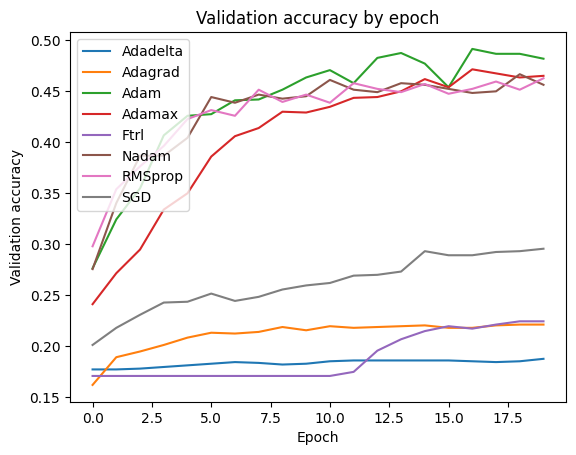

In [36]:
import matplotlib.pyplot as plt

n_mfcc=13
optimizers = ["Adadelta", "Adagrad", "Adam", "Adamax", "Ftrl", "Nadam", "RMSprop", "SGD"]
histories = []
for optimizer in optimizers:
    model = Sequential()
    model.add(LSTM(128, input_shape=(n_mfcc, max_length)))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss='categorical_crossentropy',
                  optimizer=optimizer, metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=20, batch_size=96, validation_split=0.1, use_multiprocessing=True)
    histories.append(history)
    test_loss, test_acc = model.evaluate(X_test, y_test)
    print("Test accuracy of model with {} optimizer: {:.4f}".format(optimizer, test_acc))

plt.figure()
for i in range(len(histories)):
    plt.plot(histories[i].history["val_accuracy"])
plt.legend(optimizers, loc='upper left')
plt.title("Validation accuracy by epoch")
plt.ylabel("Validation accuracy")
plt.xlabel("Epoch")
plt.show()
# This code will plot the validation accuracy of each model during each epoch, as well as print the accuracy of X_test for each optimizer after training the models.






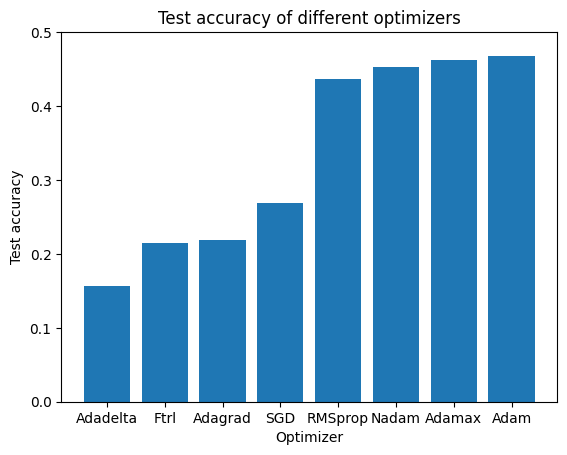

In [55]:
test_accuracies = ["0.1567","0.2193","0.4673","0.4623","0.2150","0.4522","0.4371","0.2682"]
optimizers = ["Adadelta", "Adagrad", "Adam", "Adamax", "Ftrl", "Nadam", "RMSprop", "SGD"]

# Convert the test_accuracies to float
test_accuracies = [float(acc) for acc in test_accuracies]

# Zip the optimizers and test_accuracies together and sort the list of tuples based on the test_accuracies
optimizers_and_accuracies = sorted(zip(optimizers, test_accuracies), key=lambda x: x[1])

# Unzip the sorted list of tuples
optimizers, test_accuracies = zip(*optimizers_and_accuracies)

plt.bar(optimizers, test_accuracies)
plt.title("Test accuracy of different optimizers")
plt.xlabel("Optimizer")
plt.ylabel("Test accuracy")
plt.ylim(0, 0.5)
# plt.yticks(sorted(test_accuracies))
plt.show()

### Fonction entrainement modèle, cacul accuracy, plot validation accuracy by epoch and test accuracy for different hyperparameters

In [61]:
import matplotlib.pyplot as plt

def LSTM_train_model_plot(X_train, y_train, epoch, batch_size, validation_split, num_classes, optimizers, n_mfcc=13):
    histories = []
    test_accuracies = []
    for optimizer in optimizers:
        model = Sequential()
        model.add(LSTM(128, input_shape=(n_mfcc, max_length)))
        model.add(Dense(num_classes, activation='softmax'))
        model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
        history = model.fit(X_train, y_train, epochs=epoch, batch_size=batch_size, validation_split = validation_split, use_multiprocessing=True)
        histories.append(history)
        test_loss, test_acc = model.evaluate(X_test, y_test)
        print("Test accuracy of model with {} optimizer: {:.4f}".format(optimizer, test_acc))
        test_accuracies.append(test_acc)
        


    for i in range(len(histories)):
        plt.plot(histories[i].history["val_accuracy"])
    plt.legend(optimizers, loc='upper left')
    plt.title("model accuracy")
    plt.ylabel("validation accuracy")
    plt.xlabel("epoch")
    plt.show()

    # plt.bar(optimizers, test_accuracies)
    # plt.title("Test accuracy of different optimizers")
    # plt.xlabel("Optimizer")
    # plt.ylabel("Test accuracy")
    # plt.show()
    
    return histories, test_accuracies
    

### On va tester pour Adam avec des learning_rates différents

Epoch 1/20
124/124 [==============================] - 19s 94ms/step - loss: 1.7563 - accuracy: 0.2427 - val_loss: 1.7039 - val_accuracy: 0.2748
Epoch 2/20
124/124 [==============================] - 10s 81ms/step - loss: 1.5048 - accuracy: 0.4125 - val_loss: 1.5995 - val_accuracy: 0.3562
Epoch 3/20
124/124 [==============================] - 10s 80ms/step - loss: 1.2947 - accuracy: 0.5229 - val_loss: 1.5341 - val_accuracy: 0.3754
Epoch 4/20
124/124 [==============================] - 10s 81ms/step - loss: 1.1028 - accuracy: 0.6056 - val_loss: 1.5017 - val_accuracy: 0.4010
Epoch 5/20
124/124 [==============================] - 10s 80ms/step - loss: 0.9389 - accuracy: 0.6791 - val_loss: 1.5321 - val_accuracy: 0.4169
Epoch 6/20
124/124 [==============================] - 10s 80ms/step - loss: 0.7981 - accuracy: 0.7327 - val_loss: 1.6007 - val_accuracy: 0.4042
Epoch 7/20
124/124 [==============================] - 10s 78ms/step - loss: 0.6802 - accuracy: 0.7840 - val_loss: 1.6015 - val_accuracy:

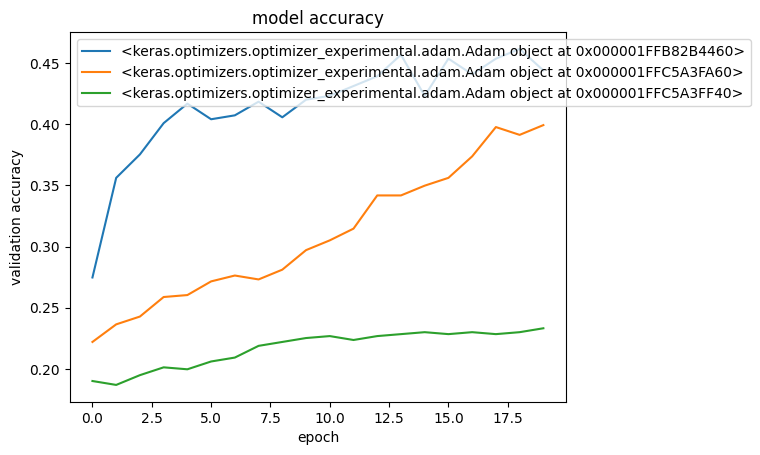

TypeError: cannot unpack non-iterable NoneType object

In [56]:
optimizers = []
# optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)

learning_rates = [1e-3, 1e-4, 1e-5]
for learning_rate in learning_rates:
    optimizers.append(tf.keras.optimizers.Adam(learning_rate))

histories, test_accuracies = LSTM_train_model_plot(X_train, y_train, epoch = 20, batch_size = 96, validation_split = 0.05, num_classes = num_classes, optimizers = optimizers, n_mfcc=13)



### Allons plus loin avec learning_rate = 1e-5 (on va prendre davantage d'epoch du coup)

Epoch 1/80
124/124 [==============================] - 31s 75ms/step - loss: 1.8669 - accuracy: 0.1687 - val_loss: 1.8884 - val_accuracy: 0.1693
Epoch 2/80
124/124 [==============================] - 9s 71ms/step - loss: 1.8498 - accuracy: 0.1772 - val_loss: 1.8772 - val_accuracy: 0.1629
Epoch 3/80
124/124 [==============================] - 8s 68ms/step - loss: 1.8352 - accuracy: 0.1853 - val_loss: 1.8677 - val_accuracy: 0.1613
Epoch 4/80
124/124 [==============================] - 7s 57ms/step - loss: 1.8222 - accuracy: 0.1928 - val_loss: 1.8601 - val_accuracy: 0.1645
Epoch 5/80
124/124 [==============================] - 7s 57ms/step - loss: 1.8105 - accuracy: 0.1982 - val_loss: 1.8531 - val_accuracy: 0.1661
Epoch 6/80
124/124 [==============================] - 7s 56ms/step - loss: 1.7997 - accuracy: 0.2056 - val_loss: 1.8467 - val_accuracy: 0.1821
Epoch 7/80
124/124 [==============================] - 7s 55ms/step - loss: 1.7898 - accuracy: 0.2112 - val_loss: 1.8409 - val_accuracy: 0.182

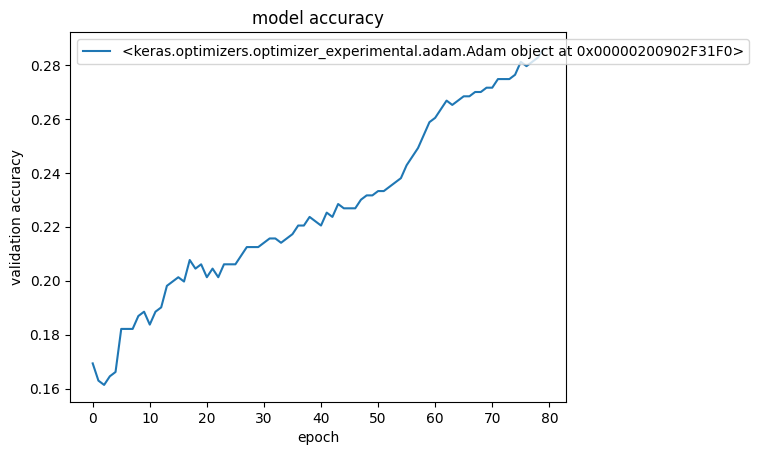

TypeError: the dtypes of parameters x (object) and width (float64) are incompatible

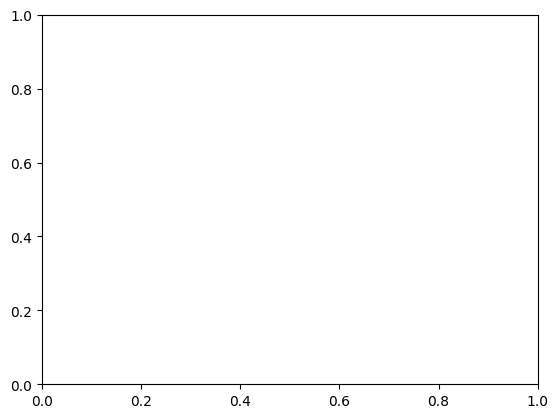

In [59]:
optimizers = []
# optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)

learning_rates = [1e-5]
for learning_rate in learning_rates:
    optimizers.append(tf.keras.optimizers.Adam(learning_rate))

histories, test_accuracies = LSTM_train_model_plot(X_train, y_train, epoch = 80, batch_size = 96, validation_split = 0.05, num_classes = num_classes, optimizers = optimizers, n_mfcc=13)



### Essayons d'aller plus loin avec learning_rates 1e-4 déjà, au moins aller jusqu'à la stabilisation

Epoch 1/80
124/124 [==============================] - 17s 87ms/step - loss: 1.8159 - accuracy: 0.1961 - val_loss: 1.7779 - val_accuracy: 0.2236
Epoch 2/80
124/124 [==============================] - 10s 80ms/step - loss: 1.7309 - accuracy: 0.2578 - val_loss: 1.7499 - val_accuracy: 0.2524
Epoch 3/80
124/124 [==============================] - 10s 83ms/step - loss: 1.6745 - accuracy: 0.2981 - val_loss: 1.7283 - val_accuracy: 0.2556
Epoch 4/80
124/124 [==============================] - 9s 76ms/step - loss: 1.6273 - accuracy: 0.3362 - val_loss: 1.7108 - val_accuracy: 0.2780
Epoch 5/80
124/124 [==============================] - 14s 112ms/step - loss: 1.5841 - accuracy: 0.3719 - val_loss: 1.6947 - val_accuracy: 0.2875
Epoch 6/80
124/124 [==============================] - 16s 128ms/step - loss: 1.5423 - accuracy: 0.4022 - val_loss: 1.6768 - val_accuracy: 0.3083
Epoch 7/80
124/124 [==============================] - 14s 114ms/step - loss: 1.5007 - accuracy: 0.4325 - val_loss: 1.6609 - val_accurac

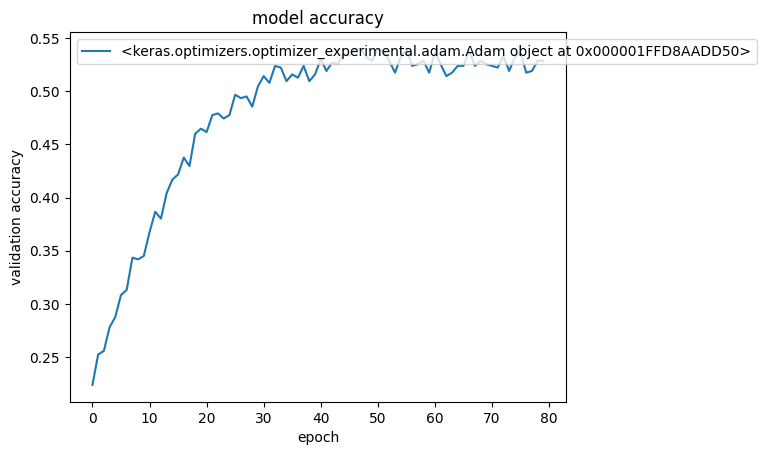

In [62]:
optimizers = []
# optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)

learning_rates = [1e-4]
for learning_rate in learning_rates:
    optimizers.append(tf.keras.optimizers.Adam(learning_rate))

histories, test_accuracies = LSTM_train_model_plot(X_train, y_train, epoch = 80, batch_size = 96, validation_split = 0.05, num_classes = num_classes, optimizers = optimizers, n_mfcc=13)


### Y a du progèrs et stabilisation vers 52% pour val_accuracy et test_accuracy 
Testons avec learning_rate=e-5 et epochs =300
On peut utiliser "initial_epoch"

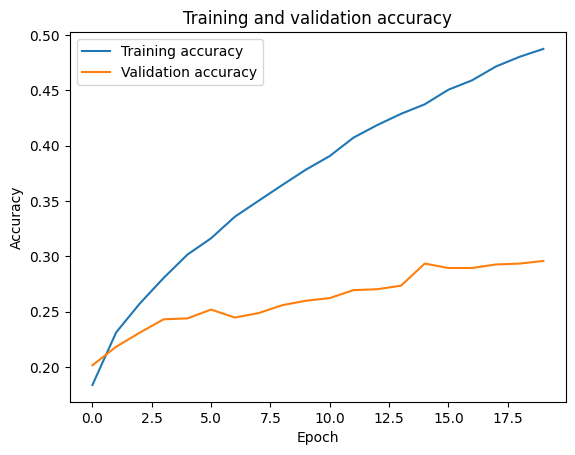

In [70]:
#test avec initial_epoch, juste 1 epoch à partir du précédent model
# test_loss, test_acc = history.evaluate(X_test, y_test)
# print("Test accuracy of model with: ", test_acc)
# history
# history = history(X_train, y_train, epoch = 1, batch_size = 96, validation_split = 0.05, num_classes = num_classes, optimizers = optimizers, initial_epoch=20, n_mfcc=13)
# print(history.history['accuracy'])

# import matplotlib.pyplot as plt

# acc = history.history['accuracy']
# val_acc = history.history['val_accuracy']

# plt.plot(acc, label='Training accuracy')
# plt.plot(val_acc, label='Validation accuracy')
# plt.legend()
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.title('Training and validation accuracy')
# plt.show()


Epoch 1/300
124/124 [==============================] - 30s 116ms/step - loss: 1.8804 - accuracy: 0.1659 - val_loss: 1.8651 - val_accuracy: 0.1629
Epoch 2/300
124/124 [==============================] - 7s 57ms/step - loss: 1.8585 - accuracy: 0.1739 - val_loss: 1.8499 - val_accuracy: 0.1693
Epoch 3/300
124/124 [==============================] - 7s 57ms/step - loss: 1.8411 - accuracy: 0.1808 - val_loss: 1.8387 - val_accuracy: 0.1709
Epoch 4/300
124/124 [==============================] - 7s 54ms/step - loss: 1.8264 - accuracy: 0.1880 - val_loss: 1.8300 - val_accuracy: 0.1757
Epoch 5/300
124/124 [==============================] - 7s 56ms/step - loss: 1.8136 - accuracy: 0.1961 - val_loss: 1.8226 - val_accuracy: 0.1789
Epoch 6/300
124/124 [==============================] - 7s 57ms/step - loss: 1.8021 - accuracy: 0.2025 - val_loss: 1.8163 - val_accuracy: 0.1837
Epoch 7/300
124/124 [==============================] - 7s 55ms/step - loss: 1.7917 - accuracy: 0.2129 - val_loss: 1.8114 - val_accurac

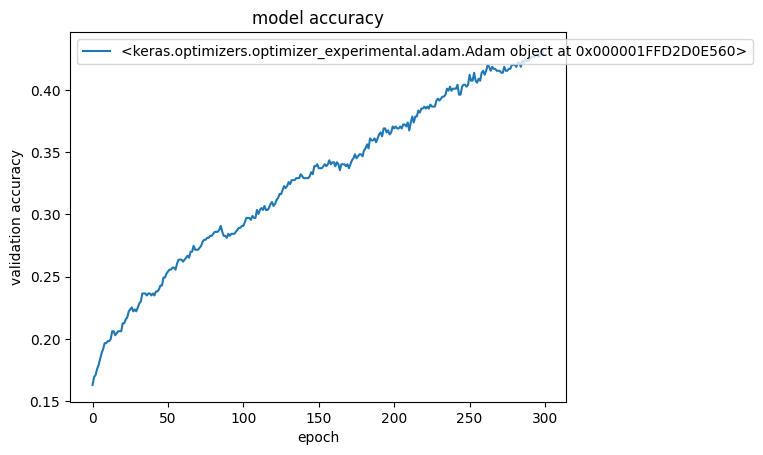

In [71]:
optimizers = []

learning_rates = [1e-5]
for learning_rate in learning_rates:
    optimizers.append(tf.keras.optimizers.Adam(learning_rate))

histories, test_accuracies = LSTM_train_model_plot(X_train, y_train, epoch = 300, batch_size = 96, validation_split = 0.05, num_classes = num_classes, optimizers = optimizers, n_mfcc=13)


In [72]:
test_accuracies


[0.4421279728412628]